In [5]:
from DQNLearner import DQNLearner
from utils import ReplayTable, EpsilonDecay
import gym

from keras.models import Model
from keras.layers import Dense, Input
from keras.optimizers import Adam
import numpy as np
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt
import csv
import seaborn as sns
import pandas as pd

In [6]:
env = gym.make('LunarLander-v2')

In [7]:
def build_model(env, hidden_layers, activation='relu'):
    inputs = Input(shape=env.observation_space.shape)
    
    if not hidden_layers:
        predictions = Dense(env.action_space.n, activation='linear')(inputs)
    
    else:
        first_layer = hidden_layers[0]
        x = Dense(first_layer, activation='relu')(inputs)
        
        for h in hidden_layers[1:]:
            x = Dense(h, activation='relu')(x)
            
        predictions = Dense(env.action_space.n, activation='linear')(x)

    model = Model(inputs=inputs, outputs=predictions)
    
    return model

# Data Collection: Training Rewards
For the first graph, we'll train the model over a grid-search of different Alpha, Gammas and Epsilons.

In [8]:
def run_episode(learner, training=True):
    observation = learner.environment.reset()
    done = False
    rewards = []
    while not done:
        if training:
            action = learner.choose_action(observation)
        else:
            action = learner.get_best_action(observation)

        next_state, reward, done, _ = learner.environment.step(action)
        rewards.append(reward)
        
        if training:
            # Store Data
            learner.update_replay(observation, action, reward, next_state, done=done)

            # Train
            learner.train(batch_size=32)
            
        observation = next_state

    return rewards

def run_viewable_episode(learner):
    observation = learner.environment.reset()
    done = False
    current_episode = 0
    rewards = []
    while not done:
        env.render()
        action = learner.choose_action(observation)

        next_state, reward, done, _ = learner.environment.step(action)
        rewards.append(reward)

        # Store Data
        learner.update_replay(observation, action, reward, next_state, done=done)
        
        # Train
        learner.train(batch_size=32)
            
        observation = next_state

    return rewards


def simulate(n_episodes, agent, log_every_episode=False, training=True):
    rewards = []
    solved_t = None
    for n in tqdm(range(n_episodes)):
        result = run_episode(agent, training=training)
        last_reward = np.round(np.sum(result), 2)
        rewards.append(result)
        
        if len(rewards) >= 100:
            avg_last_100 = np.round(np.mean([np.sum(r) for r in rewards[-100:]]), 2)
            
            if log_every_episode:
                print(f"Episode {n:<4}| Reward: {last_reward:<6}| Last 100 Avg: {avg_last_100}")
                
            if avg_last_100 >= 200 and not solved_t:
                print(f"Solved at episode: {n+1}")
                solved_t = n + 1
                
        else:
            if log_every_episode:
                print(f"Episode {n:<4}| Reward: {last_reward}")
                  
    return rewards

### Grid Search over Model, Alpha and Gamma.
We'll cover epsilon later.

In [ ]:
results = {}

alphas = [0.001, 0.01, 0.1]
gammas = [0.99, 0.9, 0.5, 0.1]
models = [[64, 64],[64],[]]
for alpha in alphas:
    for gamma in gammas:
        for layers in models:
            model = build_model(env, layers)
            model.compile(optimizer=Adam(lr=alpha), loss='mse')
            replay = ReplayTable(env.observation_space.shape[0], max_size=300000)
            agent = DQNLearner(env, model, replay, gamma=0.99, epsilon=epsilon)
            result = simulate(800, agent)
            hyperparameter_tuple = (alpha, gamma, layers)
            results[hyperparameter_tuple] = result

## Collecting Epsilon Data

In [9]:
epsilon_mins = [0.005, 0.01, 0.05, 0.1]
results = {}
for e in epsilon_mins:
    epsilon = EpsilonDecay(min_val=e)
    model = build_model(env, [64, 64])
    model.compile(optimizer=Adam(lr=0.001), loss='mse')
    replay = ReplayTable(env.observation_space.shape[0], max_size=300000)
    agent = DQNLearner(env, model, replay, gamma=0.99, epsilon=epsilon)
    result = simulate(800, agent)
    results[e] = result

Solved at episode: 245



Solved at episode: 209



Solved at episode: 620



Solved at episode: 580



In [ ]:
for epsilon in epsilon_mins:
    data = results[epsilon]
    str_epsilon = str(epsilon).replace('.',',')
    write_data(f"eps_{epsilon})

[['1.8602735712310163',
  '-2.0430885281026847',
  '-1.8672806897533007',
  '-1.6361147588833933',
  '-1.3178700897583429',
  '-1.4413071610154293',
  '2.6369161409696575',
  '4.554397314892026',
  '-1.3889461610133356',
  '-1.5669055215223853',
  '-1.4247069410942004',
  '3.5701403699441245',
  '1.6313638951900031',
  '-1.683310065848558',
  '-1.8077564589947872',
  '2.9766219046772564',
  '3.6854968517304885',
  '-2.0426197389256786',
  '4.112823497076431',
  '-2.0425045072229864',
  '0.23784124314896077',
  '4.2914235244095496',
  '0.762821857289407',
  '1.0393667602749985',
  '-1.7617993806100276',
  '4.3761593992659416',
  '-2.2460266808853064',
  '1.3356358532136994',
  '-1.3932020291918537',
  '-1.597850061486639',
  '4.3597276362277',
  '4.188366583676765',
  '-2.0594379689798346',
  '-1.1173608363075107',
  '-2.0303793982406817',
  '2.149136844691623',
  '0.6229216733767771',
  '-1.3260343322981487',
  '0.4570888077508755',
  '-0.9829612038047617',
  '-1.7939964060447255',
  '

In [10]:
def write_data(filename, data):
    with open(filename, 'w') as file:
        writer = csv.writer(filename)
        writer.writerows(data)

In [21]:
episode_reward = reward_list[combination]

In [27]:
data = pd.DataFrame(episode_reward)

In [10]:
epsilon = EpsilonDecay(min_val=0.005)
model = build_model(env, [64, 64])
gamma = 0.99
model.compile(optimizer=Adam(lr=0.001), loss='mse')
replay = ReplayTable(env.observation_space.shape[0], max_size=300000)


In [11]:
agent = DQNLearner(env, model, replay, epsilon=epsilon, gamma=gamma)

In [12]:
rewards = simulate(800, agent)

Solved at episode: 384



In [13]:
test_rewards = simulate(100, agent, training=False)

Solved at episode: 100



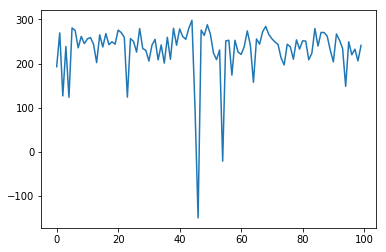

In [15]:
plt.plot([np.sum(r) for r in test_rewards])